In [4]:
import pandas as pd
from utils.plotting import plot_3d_scatter
from utils.basics import PRJ_DIR, task_cmap_caps, PNAS2015_subject_list
from utils.random import seed_value
from sklearn.cluster import KMeans
import seaborn as sns
from matplotlib.colors import rgb2hex
import os.path as osp
import xarray as xr
import numpy as np
from utils.io import read_netts
from nilearn.connectome import vec_to_sym_matrix, sym_matrix_to_vec
import matplotlib.pyplot as plt
from matplotlib import patches
from utils.basics import sbj_cmap_dict, sbj_cmap_list

In [2]:
ROI_Sorting_Path = '/data/SFIMJGC_HCP7T/manifold_learning_fmri/Data/PNAS2015/Other/Craddock_0200_SortByYeo7Networks.txt'
ROI_Sorting      = pd.read_csv(ROI_Sorting_Path, index_col=0)
ROI_Sorting

,ROI_ID,Network_ID
ROI Number,,
0,ROI000,Visual
1,ROI066,Visual
2,ROI077,Visual
3,ROI079,Visual
4,ROI082,Visual
...,...,...
152,ROI111,Subcortical
153,ROI014,Subcortical
154,ROI115,Subcortical


***

In [3]:
emb_path = '/data/SFIMJGC_HCP7T/manifold_learning_fmri/Data_Interim/PNAS2015/Procrustes/LE/Original/Procrustes_Craddock_0200.WL045s.WS1.5s.LE_correlation_k0075_m0025.asis.pkl'
emb      = pd.read_pickle(emb_path)

We look at the embedding and it clearly shows four groups

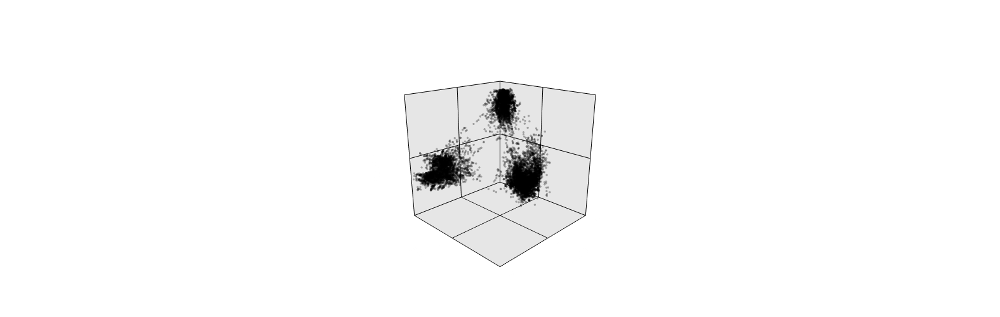

In [6]:
plot_3d_scatter(data=emb.reset_index(),x='LE001',y='LE002',z='LE003',c='Window Name', cmap=['black','black','black','black'], height=500, width=500, ax_range=[-2,2])

Becuase of that, we decide to cluster based on k=4

In [8]:
n_clusters  = 4
km          = KMeans(n_clusters=n_clusters).fit(emb[['LE001','LE002','LE003']].values)
kmeans_cmap = {'Cluster'+str(i).zfill(2):rgb2hex(c) for i,c in enumerate(sns.color_palette('tab10',n_colors=n_clusters))}

In [9]:
emb_km            = emb.copy()
emb_km.index      = ['Cluster'+str(l).zfill(2) for l in km.labels_]
emb_km.index.name = 'KMeans_Labels'

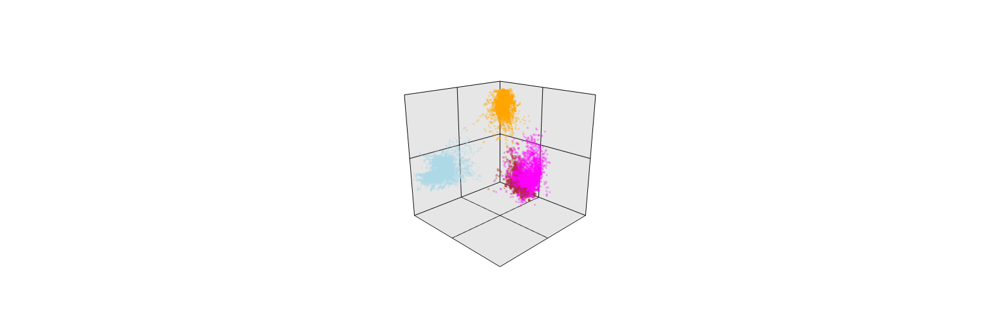

In [11]:
plot_3d_scatter(data=emb_km.reset_index(),x='LE001',y='LE002',z='LE003',c='KMeans_Labels', cmap=['orange','brown','lightblue','magenta'], height=500, width=500, ax_range=[-2,2])

In [13]:
plot_3d_scatter(data=emb.reset_index(),x='LE001',y='LE002',z='LE003',c='Window Name', cmap=[task_cmap_caps[t] for t in emb.reset_index()['Window Name'].unique()], height=500, width=500, ax_range=[-2,2])

In [17]:
plot_3d_scatter(data=emb.reset_index(),x='LE001',y='LE002',z='LE003',c='Subject', cmap=sbj_cmap_list, height=500, width=500, ax_range=[-2,2])

In [ ]:
label2task = {0:'Rest',1:'Visual Attention',2:'Math',3:'2-Back'}

In [19]:
aux_path    = osp.join(PRJ_DIR,'Data_Interim','PNAS2015','SBJ06','Original','{sbj}_Craddock_0200.WL045s.WS1.5s.tvFC.Z.asis.pkl'.format(sbj='SBJ06'))
aux_swc     = pd.read_pickle(aux_path)
aux_swc.drop('XXXX',axis=1, inplace=True)
connections = [a+'_'+b for (a,b) in list(aux_swc.index)]
windows     = list(aux_swc.columns)

In [20]:
%%time
swc_all = None
for sbj in PNAS2015_subject_list:
    swc_path = osp.join(PRJ_DIR,'Data_Interim','PNAS2015',sbj,'Original','{sbj}_Craddock_0200.WL045s.WS1.5s.tvFC.Z.asis.pkl'.format(sbj=sbj))
    swc      = pd.read_pickle(swc_path).drop('XXXX',axis=1)
    if swc_all is None:
        swc_all = swc
    else:
        swc_all = pd.concat([swc_all,swc],axis=1)
orig_cols = swc_all.columns
swc_all.columns = range(swc_all.shape[1])

CPU times: user 7.18 s, sys: 5.13 s, total: 12.3 s
Wall time: 13.9 s


In [48]:
%%time
fc_per_cluster = {}
for label in range(n_clusters):
    wins   = np.where(km.labels_ == label)[0]
    fc_vec = swc_all[wins].mean(axis=1)
    fc_vec = np.tanh(fc_vec)
    fc_mat = pd.DataFrame(vec_to_sym_matrix(fc_vec, diagonal=np.ones(157)),index=['ROI'+str(r).zfill(3) for r in range(157)], columns=['ROI'+str(r).zfill(3) for r in range(157)])
    fc_per_cluster[label] = fc_mat.loc[ROI_Sorting['ROI_ID'],ROI_Sorting['ROI_ID']]

CPU times: user 1.06 s, sys: 302 ms, total: 1.36 s
Wall time: 1.36 s


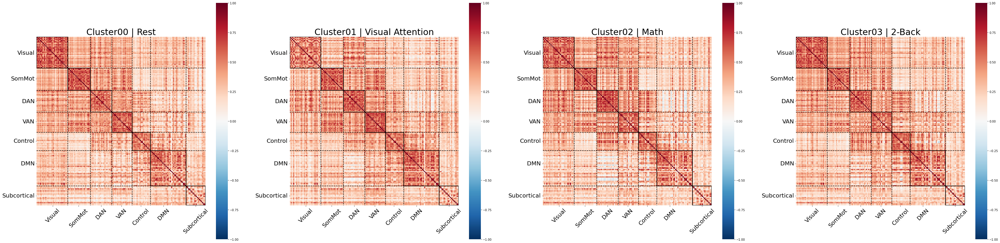

In [112]:
fig, axs = plt.subplots(1,4,figsize=(60,15))
for label in range(n_clusters):
    sns.heatmap(fc_per_cluster[label], square=True, vmin=-1,vmax=1,cmap='RdBu_r', ax=axs[label])
    annotate_matrix(axs[label])
    axs[label].set_title('Cluster'+str(label).zfill(2)+' | '+label2task[label], fontsize=30)

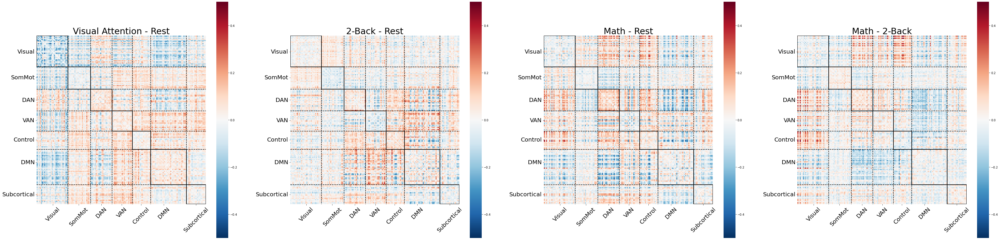

In [120]:
fig, axs = plt.subplots(1,4,figsize=(60,15))
for i,(a,b) in enumerate([(1,0),(3,0),(2,0),(2,3)]):
    sns.heatmap(fc_per_cluster[a] - fc_per_cluster[b], square=True, vmin=-.5,vmax=.5,cmap='RdBu_r', ax=axs[i])
    annotate_matrix(axs[i])
    title = label2task[a] + ' - ' + label2task[b]
    axs[i].set_title(title,fontsize=30)

In [106]:
def annotate_matrix(ax):
    rect_Visual = patches.Rectangle((0, 0), 29, 29, linewidth=2, edgecolor='k', facecolor='none')
    rect_SomatoMotor = patches.Rectangle((29, 29), 21, 21, linewidth=2, edgecolor='k', facecolor='none')
    rect_DAN     = patches.Rectangle((50, 50), 20, 20, linewidth=2, edgecolor='k', facecolor='none')
    rect_VAN     = patches.Rectangle((70, 70), 19, 19, linewidth=2, edgecolor='k', facecolor='none')
    rect_Control = patches.Rectangle((89, 89), 17, 17, linewidth=2, edgecolor='k', facecolor='none')
    rect_DMN     = patches.Rectangle((106, 106), 33, 33, linewidth=2, edgecolor='k', facecolor='none')
    rect_Subcort = patches.Rectangle((139, 139), 18, 18, linewidth=2, edgecolor='k', facecolor='none')
    ax.add_patch(rect_Visual)
    ax.add_patch(rect_SomatoMotor)
    ax.add_patch(rect_DAN)
    ax.add_patch(rect_VAN)
    ax.add_patch(rect_Control)
    ax.add_patch(rect_DMN)
    ax.add_patch(rect_Subcort)
    ax.set_yticks([15,39,60,79,97,118,148])
    ax.set_yticklabels(['Visual','SomMot','DAN','VAN','Control','DMN','Subcortical'], fontsize=20)
    ax.set_xticks([15,39,60,79,97,118,148])
    ax.set_xticklabels(['Visual','SomMot','DAN','VAN','Control','DMN','Subcortical'], fontsize=20)
    ax.tick_params(axis='x', rotation=45)
    ax.plot([0,157],[29,29],linestyle='dashed', c='k')
    ax.plot([0,157],[50,50],linestyle='dashed', c='k')
    ax.plot([0,157],[70,70],linestyle='dashed', c='k')
    ax.plot([0,157],[89,89],linestyle='dashed', c='k')
    ax.plot([0,157],[106,106],linestyle='dashed', c='k')
    ax.plot([0,157],[139,139],linestyle='dashed', c='k')
    ax.plot([29,29],[0,157],linestyle='dashed', c='k')
    ax.plot([50,50],[0,157],linestyle='dashed', c='k')
    ax.plot([70,70],[0,157],linestyle='dashed', c='k')
    ax.plot([89,89],[0,157],linestyle='dashed', c='k')
    ax.plot([106,106],[0,157],linestyle='dashed', c='k')
    ax.plot([139,139],[0,157],linestyle='dashed', c='k')

<AxesSubplot:ylabel='None-None'>

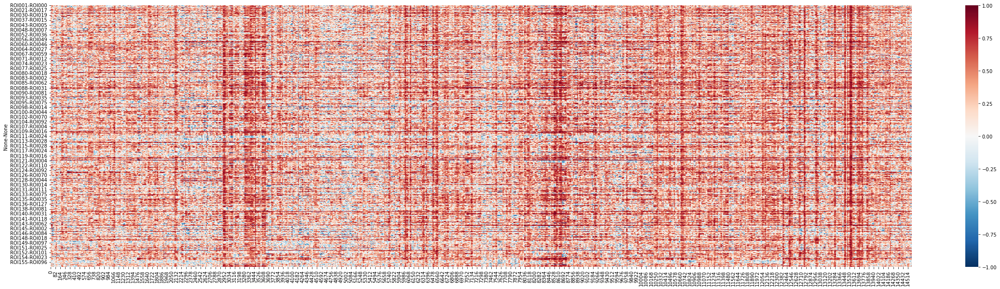

In [123]:
fig,axs=plt.subplots(1,1,figsize=(40,10))
sns.heatmap(np.tanh(swc_all), vmin=-1, vmax=1, cmap='RdBu_r')

***

## Temporal Autocorrelation

In [73]:
from utils.null_models import phase_randomize_onets, phase_randomize

In [74]:
roits_orig  = read_netts('/data/SFIMJGC_HCP7T/manifold_learning_fmri/Data/PNAS2015/SBJ06/SBJ06_Craddock_0200.WL045s_000.netts', TR_secs=1.5)
roits_prand = phase_randomize(roits_orig)

  0%|          | 0/157 [00:00<?, ?it/s]

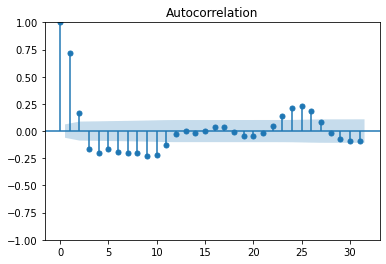

In [81]:
plot_acf(roits_orig.loc[:,'ROI001']);

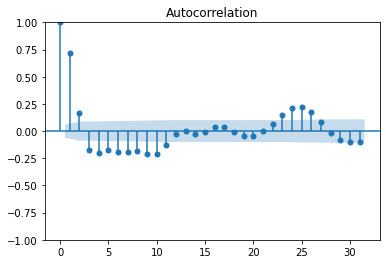

In [83]:
plot_acf(roits_prand.loc[:,'ROI001']);

In [85]:
roits_orig.loc[:,'ROI001'].hvplot() * roits_prand.loc[:,'ROI001'].hvplot()

:Overlay
   .Curve.ROI001.I  :Curve   [index]   (ROI001)
   .Curve.ROI001.II :Curve   [index]   (ROI001)

In [60]:
aux_path    = osp.join(PRJ_DIR,'Data_Interim','PNAS2015','SBJ06','Original','{sbj}_Craddock_0200.WL045s.WS1.5s.tvFC.Z.asis.pkl'.format(sbj='SBJ06'))
aux_swc     = pd.read_pickle(aux_path)
aux_swc.drop('XXXX',axis=1, inplace=True)
connections = [a+'_'+b for (a,b) in list(aux_swc.index)]
windows     = list(aux_swc.columns)

In [61]:
%%time
swc_xr = xr.DataArray(dims=['Subject','Connection','Window'], coords={'Subject':PNAS2015_subject_list,'Connection':connections,'Window':windows})
for sbj in PNAS2015_subject_list:
    swc_path = osp.join(PRJ_DIR,'Data_Interim','PNAS2015',sbj,'Null_PhaseRand','{sbj}_Craddock_0200.WL045s.WS1.5s.tvFC.Z.asis.pkl'.format(sbj=sbj))
    swc      = pd.read_pickle(swc_path).drop('XXXX',axis=1)
    swc_xr.loc[sbj,:,:] = swc

CPU times: user 3.77 s, sys: 1.89 s, total: 5.66 s
Wall time: 7.96 s


In [62]:
import pandas as pd
from matplotlib import pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, acf

In [86]:
df = pd.DataFrame(index=connections, columns=['TR'+str(i) for i in range(41)])
for connection in connections:
    aux = swc_xr.loc['SBJ08',connection,:]
    df.loc[connection,:] = acf(aux,nlags=40)

Text(0.5, 1.0, '')

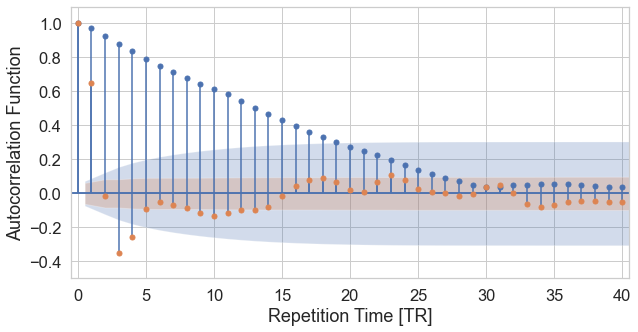

In [117]:
sns.set(font_scale=1.5, style='whitegrid')
fig, ax = plt.subplots(1,1,figsize=(10,5))
plot_acf(swc_xr.loc['SBJ06',connections[0],:], ax=ax, lags=40, label='tvFC');
plot_acf(roits_orig.loc[:,'ROI003'], ax=ax, lags=40, label='ROI Time series');
ax.set_ylim(-.5,1.1);
ax.set_xlim(-0.5,40.5);
ax.set_ylabel('Autocorrelation Function')
ax.set_xlabel('Repetition Time [TR]')
ax.set_title('')
#plt.legend(loc="upper left")

:Curve   [index]   (0)

In [18]:
cluster00_fc_mat.loc[]

,ROI000,ROI001,ROI002,ROI003,ROI004,ROI005,ROI006,ROI007,ROI008,ROI009,...,ROI147,ROI148,ROI149,ROI150,ROI151,ROI152,ROI153,ROI154,ROI155,ROI156
ROI000,1.414214,0.237052,0.351857,0.279756,0.256725,0.398118,0.200862,0.295309,0.276111,0.269509,...,0.359218,0.728843,0.242364,0.180536,0.285837,0.238639,0.603899,0.337825,0.129051,0.386945
ROI001,0.237052,1.414214,0.459278,0.142777,0.597972,0.274477,0.192988,0.254826,0.713684,0.283627,...,0.238664,0.342033,0.190607,0.675743,0.546582,0.261499,0.266317,0.372232,0.175116,0.284422
ROI002,0.351857,0.459278,1.414214,0.281644,0.555402,0.573873,0.172923,0.290674,0.332716,0.381432,...,0.369728,0.491858,0.338494,0.400336,0.386490,0.357063,0.408354,0.526686,0.272861,0.426259
ROI003,0.279756,0.142777,0.281644,1.414214,0.244069,0.593462,0.187835,0.404664,0.255936,0.141515,...,0.448037,0.431458,0.094460,0.125047,0.151605,0.154016,0.201152,0.391514,0.027767,0.730716
ROI004,0.256725,0.597972,0.555402,0.244069,1.414214,0.348286,0.089371,0.213524,0.455392,0.327052,...,0.218698,0.366329,0.258716,0.642877,0.618970,0.397297,0.270486,0.351688,0.245666,0.348084
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ROI152,0.238639,0.261499,0.357063,0.154016,0.397297,0.251319,0.150601,0.106163,0.252230,0.232957,...,0.210719,0.356621,0.579326,0.274723,0.313834,1.414214,0.428827,0.340454,0.517798,0.201994
ROI153,0.603899,0.266317,0.408354,0.201152,0.270486,0.346244,0.183954,0.191658,0.289097,0.286003,...,0.353759,0.630854,0.425427,0.257751,0.296516,0.428827,1.414214,0.443977,0.340126,0.262302
ROI154,0.337825,0.372232,0.526686,0.391514,0.351688,0.722349,0.242011,0.263186,0.286099,0.305104,...,0.699061,0.459957,0.374698,0.361948,0.312360,0.340454,0.443977,1.414214,0.333142,0.415417
ROI155,0.129051,0.175116,0.272861,0.027767,0.245666,0.134719,-0.043131,0.042609,0.159624,0.040756,...,0.206992,0.210238,0.736973,0.211274,0.199892,0.517798,0.340126,0.333142,1.414214,0.035318


In [16]:
ROI_Sorting

,ROI_ID,ROI_Name
0,0,ROI000
1,1,ROI066
2,2,ROI077
3,3,ROI079
4,4,ROI082
...,...,...
152,152,ROI111
153,153,ROI014
154,154,ROI115
155,155,ROI063


In [229]:
netts_path = '/data/SFIMJGC_HCP7T/manifold_learning_fmri/Data/PNAS2015/SBJ06/SBJ06_Craddock_0200.WL030s_000.netts'
netts = read_netts(netts_path, TR_secs=1.5) 

In [230]:
fc = netts.corr()

<AxesSubplot:>

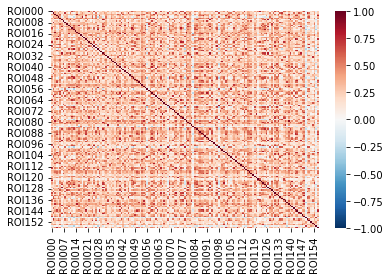

In [231]:
sns.heatmap(fc, vmin=-1, vmax=1, cmap='RdBu_r')

In [233]:
fc_nl_vec = sym_matrix_to_vec(fc.values, discard_diagonal=True)
fc_nl_vec

array([ 0.02202932,  0.38350437,  0.392     , ...,  0.04804078,
        0.21649516, -0.06528334])

In [234]:
sel             = np.triu(np.ones(fc.shape),1).astype(bool)
fc_jv_vec       = fc.where(sel).T.stack().values
fc_jv_vec

array([ 0.02202932,  0.38350437,  0.392     , ...,  0.04804078,
        0.21649516, -0.06528334])

In [237]:
fc_jv_rec = pd.DataFrame(vec_to_sym_matrix(fc_jv_vec,diagonal=np.ones(157)/np.sqrt(2)), index=fc.index, columns=fc.columns)

In [238]:
fc - fc_jv_rec

,ROI000,ROI001,ROI002,ROI003,ROI004,ROI005,ROI006,ROI007,ROI008,ROI009,...,ROI147,ROI148,ROI149,ROI150,ROI151,ROI152,ROI153,ROI154,ROI155,ROI156
ROI000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ROI001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ROI002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ROI003,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ROI004,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ROI152,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ROI153,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ROI154,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ROI155,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
